# Wczytanie danych i ustawienie Notebboka

In [1]:
import pandas as pd
import numpy as np
import shap
import scipy
from scipy.stats import ttest_ind, t
from scipy.stats import chi2_contingency, chi2
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import hvplot.pandas
from matplotlib import rcParams
import seaborn as sns
from scipy.stats import pearsonr
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_diabetes, load_boston
from sklearn.metrics import *
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier, cv, Pool
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [2]:
dic = pd.read_csv('data/LCDataDictionary.csv')
dic = dic.dropna(how="all", axis=1)
dic

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...
...,...,...
148,settlement_amount,The loan amount that the borrower has agreed t...
149,settlement_percentage,The settlement amount as a percentage of the p...
150,settlement_term,The number of months that the borrower will be...
151,NaN,NaN


In [3]:
df = pd.read_csv('data/Loan_data.csv', low_memory=False)
df

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,1077501,NaN,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,NaN,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,NaN,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,NaN,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,NaN,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42531,73582,NaN,3500.0,3500.0,225.0,36 months,10.28%,113.39,C,C1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
42532,72998,NaN,1000.0,1000.0,0.0,36 months,9.64%,32.11,B,B4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
42533,72176,NaN,2525.0,2525.0,225.0,36 months,9.33%,80.69,B,B3,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
42534,71623,NaN,6500.0,6500.0,0.0,36 months,8.38%,204.84,A,A5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
#Deliting columns about information collected after loan acceptation
df = df.drop(columns=["mths_since_last_delinq", "last_pymnt_d",
                      "collection_recovery_fee", "recoveries", "issue_d",
                      "total_rec_late_fee", "total_rec_prncp", "funded_amnt",
                      "funded_amnt_inv", "last_fico_range_high",
                      "last_fico_range_low", 'debt_settlement_flag'])

# Obróbka danych

In [5]:
df.shape

(42536, 139)

## Missing Values

In [6]:
df.isna().sum()[df.isna().sum() > 0]

member_id                42536
loan_amnt                    1
term                         1
int_rate                     1
installment                  1
                         ...  
settlement_status        42376
settlement_date          42376
settlement_amount        42376
settlement_percentage    42376
settlement_term          42376
Length: 138, dtype: int64

In [7]:
# Droping columns where >90% of values are missing
df = df.drop(columns=df.isna().sum()[
    df.isna().sum() > 0.9 * len(df)].index.tolist()).dropna(how="all", axis=1)


In [8]:
#Dropping columns where every record have the same value or the number of unique val is bigger than 40% of df length
df = df.drop(columns=df.nunique()[df.nunique() == 1].index.tolist())
df = df.drop(columns=df.nunique()[df.nunique() > len(df) / 2.5].index.tolist())
df.isna().sum()[df.isna().sum() > 0]

loan_amnt                  1
term                       1
int_rate                   1
installment                1
grade                      1
sub_grade                  1
emp_length              1113
home_ownership             1
annual_inc                 5
verification_status        1
loan_status                1
purpose                    1
zip_code                   1
addr_state                 1
dti                        1
delinq_2yrs               30
earliest_cr_line          30
fico_range_low             1
fico_range_high            1
inq_last_6mths            30
open_acc                  30
pub_rec                   30
revol_util                91
total_acc                 30
last_credit_pull_d         5
acc_now_delinq            30
delinq_amnt               30
pub_rec_bankruptcies    1366
tax_liens                106
dtype: int64

In [9]:
# Dropping rows with many null val
df = df.drop(df[df["pub_rec"].isna()].index)

In [10]:
# Filling NA val
df["pub_rec_bankruptcies"].fillna(0, inplace=True)
df.isna().sum()[df.isna().sum() > 0] / len(df) * 100

emp_length            2.616101
revol_util            0.143509
last_credit_pull_d    0.007058
tax_liens             0.178798
dtype: float64

In [11]:
# Dropping last NA
df.dropna()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,...,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc,last_credit_pull_d,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,5000.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,Verified,...,1.0,3.0,0.0,83.7%,9.0,Aug-2018,0.0,0.0,0.0,0.0
1,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,...,5.0,3.0,0.0,9.4%,4.0,Oct-2016,0.0,0.0,0.0,0.0
2,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,...,2.0,2.0,0.0,98.5%,10.0,Jun-2017,0.0,0.0,0.0,0.0
3,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,...,1.0,10.0,0.0,21%,37.0,Apr-2016,0.0,0.0,0.0,0.0
4,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,Source Verified,...,0.0,15.0,0.0,53.9%,38.0,Apr-2018,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42472,8000.0,36 months,9.96%,257.99,B,B5,3 years,OWN,25000.0,Not Verified,...,1.0,3.0,0.0,19.2%,3.0,Apr-2014,0.0,0.0,0.0,0.0
42474,13000.0,36 months,10.91%,425.04,C,C3,2 years,MORTGAGE,62000.0,Not Verified,...,4.0,23.0,1.0,50.2%,53.0,Jun-2011,0.0,0.0,1.0,0.0
42476,10500.0,36 months,15.33%,365.69,F,F2,< 1 year,RENT,62000.0,Not Verified,...,13.0,3.0,0.0,95.8%,7.0,Aug-2018,0.0,0.0,0.0,0.0
42477,2000.0,36 months,13.43%,67.81,E,E1,7 years,RENT,45000.0,Not Verified,...,8.0,7.0,1.0,54.1%,7.0,May-2018,0.0,0.0,0.0,1.0


In [12]:
df.shape

(42506, 29)

## Data Cleaning

In [13]:
# Hunting duplicates
df.duplicated()[df.duplicated()]

Series([], dtype: bool)

In [14]:
df.describe(include="all").T.sort_values("unique")

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
term,42506,2,36 months,31505,NaN,NaN,NaN,NaN,NaN,NaN,NaN
verification_status,42506,3,Not Verified,18729,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan_status,42506,4,Fully Paid,34116,NaN,NaN,NaN,NaN,NaN,NaN,NaN
home_ownership,42506,5,RENT,20164,NaN,NaN,NaN,NaN,NaN,NaN,NaN
grade,42506,7,B,12379,NaN,NaN,NaN,NaN,NaN,NaN,NaN
emp_length,41394,11,10+ years,9366,NaN,NaN,NaN,NaN,NaN,NaN,NaN
purpose,42506,14,debt_consolidation,19775,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sub_grade,42506,35,B3,2994,NaN,NaN,NaN,NaN,NaN,NaN,NaN
addr_state,42506,50,CA,7429,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_credit_pull_d,42503,133,Aug-2018,9244,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
pd.set_option("max_colwidth", dic.Description.map(lambda x: len(str(x))).max())
dic[dic["LoanStatNew"].isin(df.columns.tolist())]
#pd.reset_option("max_colwidth")

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower is now delinquent.
2,addr_state,The state provided by the borrower in the loan application
4,annual_inc,The self-reported annual income provided by the borrower during registration.
13,delinq_2yrs,The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
14,delinq_amnt,The past-due amount owed for the accounts on which the borrower is now delinquent.
16,dti,"A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income."
18,earliest_cr_line,The month the borrower's earliest reported credit line was opened
19,emp_length,Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.
21,fico_range_high,The upper boundary range the borrower’s FICO at loan origination belongs to.
22,fico_range_low,The lower boundary range the borrower’s FICO at loan origination belongs to.


In [16]:
df["emp_length"].sort_values().unique()

array(['1 year', '10+ years', '2 years', '3 years', '4 years', '5 years',
       '6 years', '7 years', '8 years', '9 years', '< 1 year', nan],
      dtype=object)

In [17]:
df["emp_length"] = pd.to_numeric(df["emp_length"].replace(
    {"10+ years": "10 years", "< 1 year": "0 years"}).str[:2])

In [18]:
df["term"].unique()

array([' 36 months', ' 60 months'], dtype=object)

In [19]:
df["term"] = df["term"].str[0:3].astype(int)

In [20]:
# Correcting varibles containg "%" or "XXX" in all records
df["revol_util"] = df["revol_util"].str[0:-1]
df["int_rate"] = df["int_rate"].str[0:-1]
df["zip_code"] = df["zip_code"].str[0:3]

In [21]:
# Correting data type
# Date
for column in df.columns[df.columns.str.endswith("d")].tolist():
    df[column].astype("datetime64", copy=False).dt.date
df["earliest_cr_line"] = df["earliest_cr_line"].astype("datetime64",
                                                       copy=False).dt.year
# float
df["int_rate"].astype(float, copy=False)
df["revol_util"].astype(float, copy=False)

0        83.7
1         9.4
2        98.5
3        21.0
4        53.9
         ... 
42509     NaN
42511    85.0
42512     2.2
42513    66.0
42514    63.5
Name: revol_util, Length: 42506, dtype: float64

In [22]:
df["loan_status"] = df["loan_status"].replace(
    {"Does not meet the credit policy. Status:Fully Paid": "Fully Paid",
     "Does not meet the credit policy. Status:Charged Off": "Charged Off"})

In [23]:
# Hunting for columns to remove
for i in df:
    if df[i].value_counts().values[1] < 10: display(df[i].value_counts())
df.drop(columns=['acc_now_delinq', 'delinq_amnt', 'tax_liens'], inplace=True)

0.0    42502
1.0        4
Name: acc_now_delinq, dtype: int64

0.0       42504
27.0          1
6053.0        1
Name: delinq_amnt, dtype: int64

0.0    42429
1.0        1
Name: tax_liens, dtype: int64

In [24]:
# Removing outliers
for column in df.select_dtypes(['float', 'int']):
    lower, upper = df[column].mean() - (df[column].std() * 3), df[
        column].mean() + (df[column].std() * 3)
outliers = [x for x in df[column] if x < lower or x > upper]
df[column] = df[column][~df[column].isin(outliers)]
print('Identified outliers: %d' % len(outliers))
outliers_removed = [x for x in df[column] if x >= lower and x <= upper]
print('Non-outlier observations: %d' % len(outliers_removed))
df.dropna(inplace=True)

Identified outliers: 1854
Non-outlier observations: 40652


In [25]:
df

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,...,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc,last_credit_pull_d,pub_rec_bankruptcies
0,5000.0,36,10.65,162.87,B,B2,10.0,RENT,24000.0,Verified,...,1985,735.0,739.0,1.0,3.0,0.0,83.7,9.0,Aug-2018,0.0
1,2500.0,60,15.27,59.83,C,C4,0.0,RENT,30000.0,Source Verified,...,1999,740.0,744.0,5.0,3.0,0.0,9.4,4.0,Oct-2016,0.0
2,2400.0,36,15.96,84.33,C,C5,10.0,RENT,12252.0,Not Verified,...,2001,735.0,739.0,2.0,2.0,0.0,98.5,10.0,Jun-2017,0.0
3,10000.0,36,13.49,339.31,C,C1,10.0,RENT,49200.0,Source Verified,...,1996,690.0,694.0,1.0,10.0,0.0,21,37.0,Apr-2016,0.0
4,3000.0,60,12.69,67.79,B,B5,1.0,RENT,80000.0,Source Verified,...,1996,695.0,699.0,0.0,15.0,0.0,53.9,38.0,Apr-2018,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42508,6000.0,36,13.12,202.51,D,D5,2.0,RENT,12000.0,Not Verified,...,2004,655.0,659.0,9.0,15.0,0.0,49.3,16.0,Sep-2012,0.0
42511,10000.0,36,14.70,345.18,E,E5,1.0,RENT,50000.0,Not Verified,...,1999,650.0,654.0,0.0,14.0,0.0,85,20.0,Aug-2010,0.0
42512,2000.0,36,7.12,61.87,A,A1,7.0,MORTGAGE,150000.0,Not Verified,...,1984,800.0,804.0,0.0,7.0,0.0,2.2,16.0,Jun-2010,0.0
42513,6000.0,36,10.59,195.28,C,C2,0.0,RENT,20000.0,Not Verified,...,1996,695.0,699.0,4.0,5.0,0.0,66,6.0,Oct-2014,0.0


# EDA, czyli obszerna eksploracja danych

In [26]:
sns.set_context("talk")

In [27]:
def chance_of_paid(col, x):
    grade = pd.concat([df.groupby(col)[col].count().rename(index='sum'),
                       df[df['loan_status'] == 'Fully Paid'].groupby(col)[
                           col].count().rename(index='Paid'),
                       df[df['loan_status'] == 'Charged Off'].groupby(col)[
                           col].count().rename(index='UnPaid')],
                      axis=1).reset_index()
    grade = grade[grade['sum'] > 20]
    grade['%Paid'] = round(grade['Paid'] / grade['sum'] * 100, 2)
    display(grade)
    sns.catplot(height=5, aspect=x / 5, data=grade, x=col, y="%Paid", s=10)
    plt.xticks(rotation=45)

,grade,sum,Paid,UnPaid,%Paid
0,A,9662,9107,555,94.26
1,B,11522,10145,1377,88.05
2,C,8071,6732,1339,83.41
3,D,5555,4371,1184,78.69
4,E,3130,2341,789,74.79
5,F,1184,816,368,68.92
6,G,473,326,147,68.92


,sub_grade,sum,Paid,UnPaid,%Paid
0,A1,1052,1028,24,97.72
1,A2,1445,1374,71,95.09
2,A3,1745,1655,90,94.84
3,A4,2772,2607,165,94.05
4,A5,2648,2443,205,92.26
5,B1,1743,1583,160,90.82
6,B2,1957,1747,210,89.27
7,B3,2785,2456,329,88.19
8,B4,2432,2100,332,86.35
9,B5,2605,2259,346,86.72


,term,sum,Paid,UnPaid,%Paid
0,36,29390,25921,3469,88.20
1,60,10207,7917,2290,77.56


,int_rate,sum,Paid,UnPaid,%Paid
0,5.42,524,510.0,14.0,97.33
1,5.79,389,374.0,15.0,96.14
2,5.99,326,308.0,18.0,94.48
4,6.03,412,407.0,5.0,98.79
5,6.17,237,229.0,8.0,96.62
...,...,...,...,...,...
373,21.67,38,25.0,13.0,65.79
374,21.74,27,11.0,16.0,40.74
376,22.06,32,21.0,11.0,65.62
377,22.11,29,22.0,7.0,75.86


,fico_range_low,sum,Paid,UnPaid,%Paid
6,640.0,99,71.0,28.0,71.72
7,645.0,106,73.0,33.0,68.87
8,650.0,126,91.0,35.0,72.22
9,655.0,119,85.0,34.0,71.43
10,660.0,1490,1158.0,332.0,77.72
11,665.0,1688,1294.0,394.0,76.66
12,670.0,1688,1325.0,363.0,78.50
13,675.0,1825,1488.0,337.0,81.53
14,680.0,2011,1634.0,377.0,81.25
15,685.0,2070,1724.0,346.0,83.29


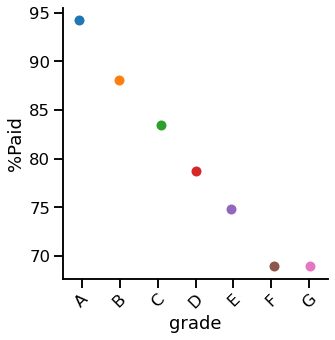

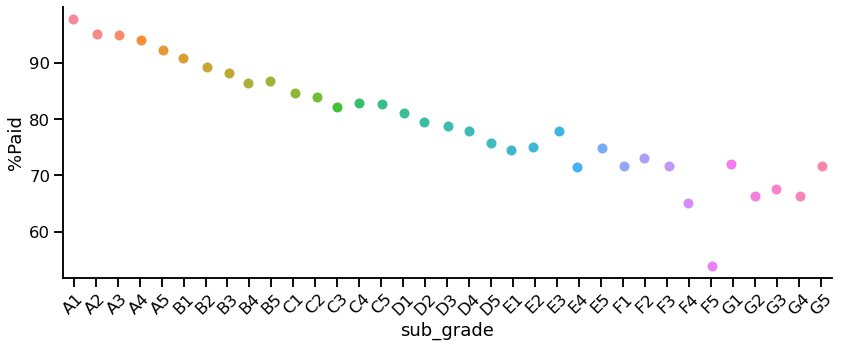

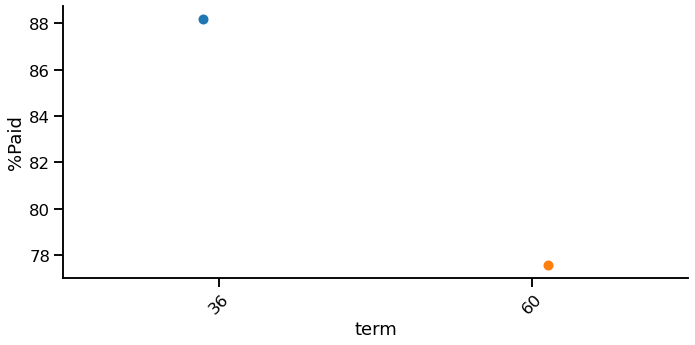

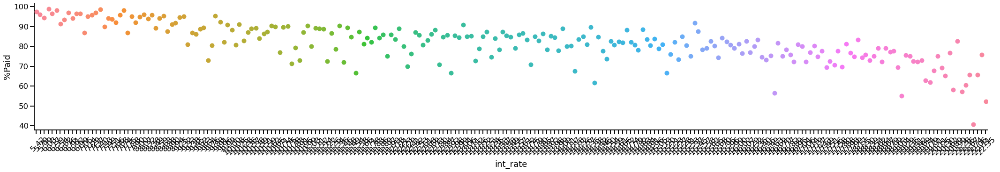

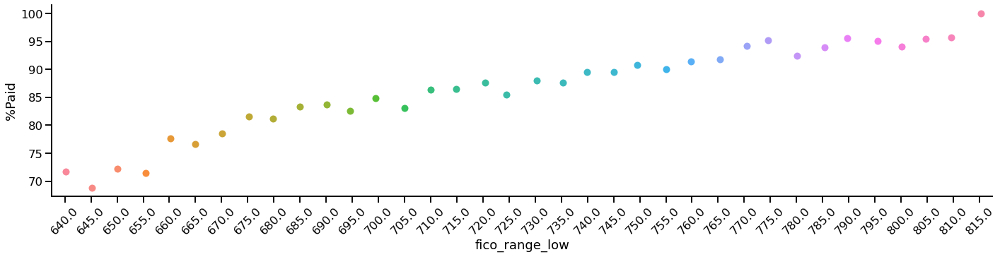

In [28]:
chance_of_paid('grade', 5)
chance_of_paid('sub_grade', 12)
chance_of_paid('term', 10)
chance_of_paid('int_rate', 30)
chance_of_paid('fico_range_low', 20)

In [29]:
# Is seams that there is a correlation between a change to paid a loan and a grade, subgrade and term

In [30]:
# Changing categorical data into numeric
le = LabelEncoder()
# passing bridge-types-cat column (label encoded values of bridge_types)
df_numeric = df.copy()
for column in df.select_dtypes(object):
    le.fit(df_numeric[column].unique().tolist())
    df_numeric[column][df_numeric[column].notna()] = le.transform(
        df_numeric[column])


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [31]:
df_numeric = df_numeric.astype(float)

array([[<AxesSubplot:title={'center':'loan_amnt'}>,
        <AxesSubplot:title={'center':'term'}>,
        <AxesSubplot:title={'center':'int_rate'}>,
        <AxesSubplot:title={'center':'installment'}>,
        <AxesSubplot:title={'center':'grade'}>],
       [<AxesSubplot:title={'center':'sub_grade'}>,
        <AxesSubplot:title={'center':'emp_length'}>,
        <AxesSubplot:title={'center':'home_ownership'}>,
        <AxesSubplot:title={'center':'annual_inc'}>,
        <AxesSubplot:title={'center':'verification_status'}>],
       [<AxesSubplot:title={'center':'loan_status'}>,
        <AxesSubplot:title={'center':'purpose'}>,
        <AxesSubplot:title={'center':'zip_code'}>,
        <AxesSubplot:title={'center':'addr_state'}>,
        <AxesSubplot:title={'center':'dti'}>],
       [<AxesSubplot:title={'center':'delinq_2yrs'}>,
        <AxesSubplot:title={'center':'earliest_cr_line'}>,
        <AxesSubplot:title={'center':'fico_range_low'}>,
        <AxesSubplot:title={'center':'fico_r

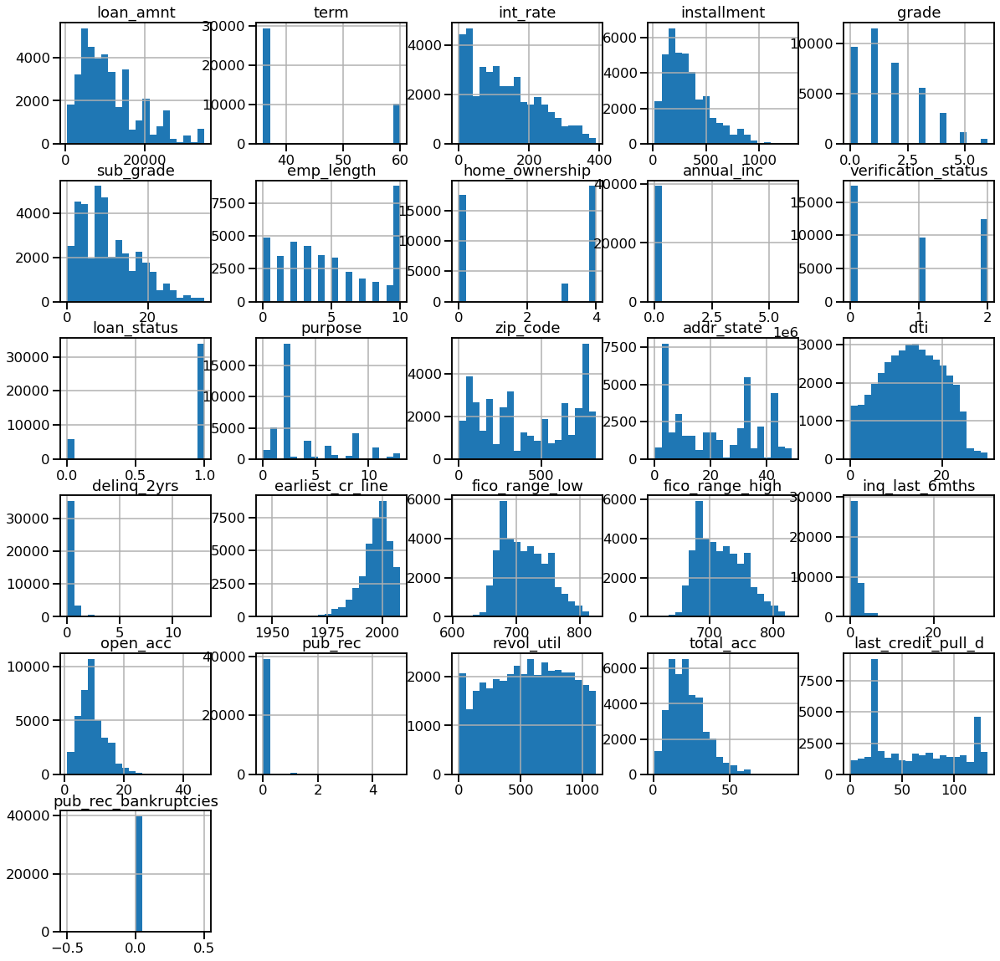

In [32]:
df_numeric.hist(figsize=(20, 20), bins=20)
# Some of the data needs to be normalized before modeling

In [33]:
#Dropping columns where every record have the same value or the number of unique val is bigger than 40% of df length
df = df.drop(columns=df.nunique()[df.nunique() == 1].index.tolist())
df = df.drop(columns=df.nunique()[df.nunique() > len(df) / 2.5].index.tolist())
df.isna().sum()[df.isna().sum() > 0]

Series([], dtype: int64)

In [34]:
def corr_hitmap(df, color):
    mask = np.zeros_like(df.corr().round(2))
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        f, ax = plt.subplots(figsize=(30, 30))
        ax = sns.heatmap(df.corr(), annot=True, mask=mask, vmax=.3, square=True,
                         xticklabels=df.columns, yticklabels=df.columns,
                         cmap=color)

In [35]:
df_numeric.corr()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,...,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc,last_credit_pull_d,pub_rec_bankruptcies
loan_amnt,1.000000,0.356274,0.287560,0.930342,0.252230,0.262341,0.162826,-0.180998,0.275635,0.416661,...,-0.207567,0.137731,0.137731,-0.029777,0.174472,-0.040197,0.053951,0.259592,-0.003164,NaN
term,0.356274,1.000000,0.430634,0.096315,0.376997,0.385905,0.116966,-0.107185,0.044184,0.265876,...,-0.050344,0.001838,0.001838,-0.014396,0.043205,-0.013831,0.056853,0.095516,0.035798,NaN
int_rate,0.287560,0.430634,1.000000,0.265946,0.949019,0.958215,-0.001037,0.054112,0.054813,0.200247,...,0.102495,-0.682718,-0.682718,0.172902,0.029094,0.053815,0.389019,-0.024917,0.027995,NaN
installment,0.930342,0.096315,0.265946,1.000000,0.241241,0.248984,0.132019,-0.144274,0.277377,0.358278,...,-0.185701,0.067812,0.067812,-0.009964,0.173906,-0.033811,0.081596,0.235961,-0.011817,NaN
grade,0.252230,0.376997,0.949019,0.241241,1.000000,0.980984,-0.019716,0.054971,0.051714,0.153984,...,0.095267,-0.692619,-0.692619,0.211316,0.032691,0.062282,0.374800,-0.028731,0.022101,NaN
sub_grade,0.262341,0.385905,0.958215,0.248984,0.980984,1.000000,-0.022573,0.056306,0.053391,0.160211,...,0.098922,-0.708504,-0.708504,0.218613,0.035483,0.063985,0.379856,-0.028264,0.019906,NaN
emp_length,0.162826,0.116966,-0.001037,0.132019,-0.019716,-0.022573,1.000000,-0.260140,0.117755,0.101271,...,-0.289092,0.101610,0.101610,-0.023055,0.100515,0.016658,0.009333,0.215634,-0.010466,NaN
home_ownership,-0.180998,-0.107185,0.054112,-0.144274,0.054971,0.056306,-0.260140,1.000000,-0.205441,-0.086514,...,0.276426,-0.168335,-0.168335,-0.060588,-0.214133,-0.003587,0.059467,-0.339739,0.015261,NaN
annual_inc,0.275635,0.044184,0.054813,0.277377,0.051714,0.053391,0.117755,-0.205441,1.000000,0.129017,...,-0.205192,0.055062,0.055062,0.027615,0.168274,-0.007377,0.022485,0.248314,-0.018482,NaN
verification_status,0.416661,0.265876,0.200247,0.358278,0.153984,0.160211,0.101271,-0.086514,0.129017,1.000000,...,-0.075545,0.019775,0.019775,-0.037363,0.083703,-0.016769,0.052966,0.123336,0.008695,NaN


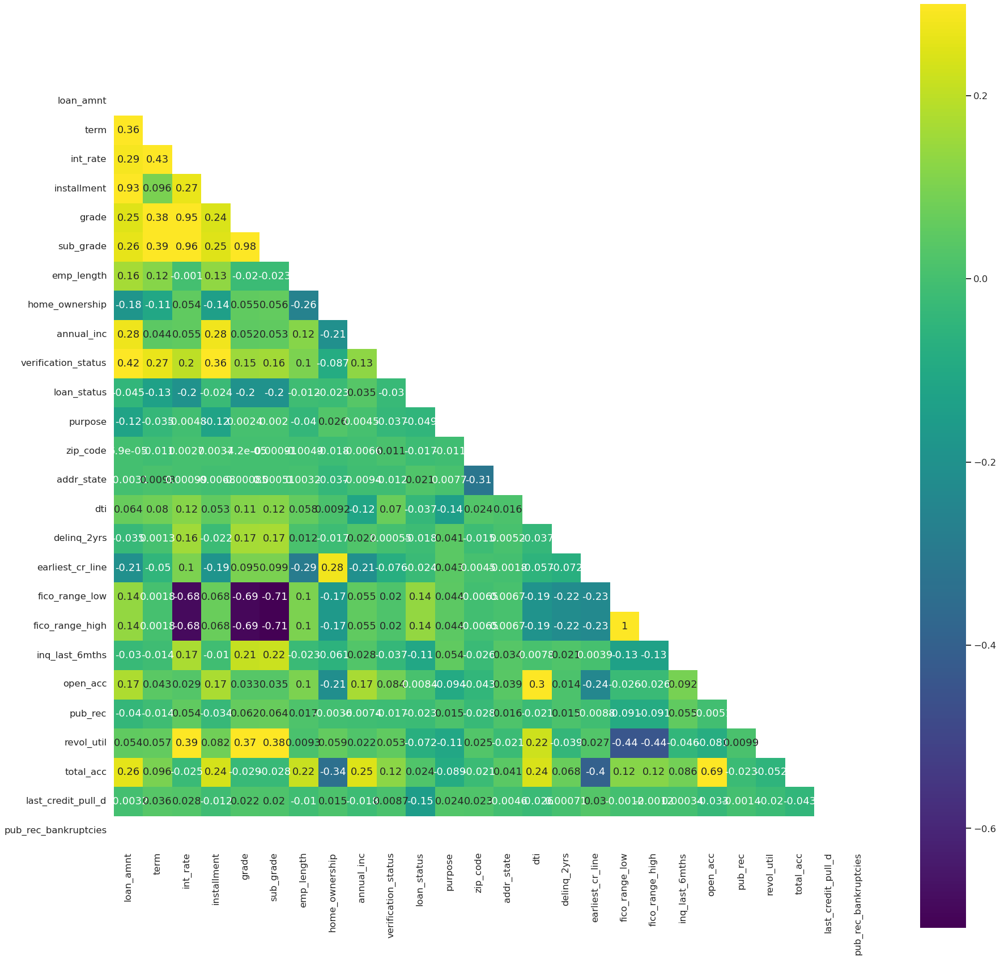

In [36]:
corr_hitmap(df=df_numeric, color='viridis')

In [37]:
# since the 'fico_range_low' and 'fico_range_high' are perfectly the same correlated with other varibles,
# one of them I droped from the data
df.drop(columns='fico_range_high', inplace=True)


In [38]:
# function for calculating the t-test for two independent samples
def independent_ttest(col, alpha=0.05):
    data1 = df_numeric[df_numeric['loan_status'] == 1][col]
    data2 = df_numeric[df_numeric['loan_status'] == 0][col]
    # calculate means and standard errora
    mean1, mean2 = data1.mean(), data2.mean()
    se1, se2 = data1.sem(), data2.sem()
    sed = np.sqrt(se1 ** 2.0 + se2 ** 2.0)
    # calculate the t statistic
    t_stat = (mean1 - mean2) / sed
    # degrees of freedom
    fd = len(data1) + len(data2) - 2
    # calculate the critical value
    cv = t.ppf(1.0 - alpha, fd)
    # calculate the p-value
    p = (1.0 - t.cdf(abs(t_stat), fd)) * 2.0
    # return everything
    if p > alpha:
        print('Accept null hypothesis that the means are equal.')
    else:
        print('Reject the null hypothesis that the means are equal.')
    orignal_fun = ttest_ind(df[df['loan_status'] == 1][col],
                            df[df['loan_status'] == 0][col])
    return t_stat, fd, cv, p, orignal_fun

In [39]:
independent_ttest('grade', alpha=0.05)

Reject the null hypothesis that the means are equal.


(-37.883541957516776,
 39595,
 1.6448921117353197,
 0.0,
 Ttest_indResult(statistic=nan, pvalue=nan))

In [40]:
def chi2_test(col, col2='loan_status'):
    table = pd.crosstab(df_numeric[col], df_numeric[col2], margins=False)
    stat, p, dof, expected = chi2_contingency(table)
    alpha = 0.05
    print("p value is " + str(p))
    prob = 0.95
    critical = chi2.ppf(prob, dof)
    if abs(stat) >= critical:
        print('Dependent (reject H0)')
    else:
        print('Independent (fail to reject H0)')

In [41]:
df_numeric.corr()['loan_status'].sort_values()

sub_grade              -0.199915
grade                  -0.196516
int_rate               -0.195878
last_credit_pull_d     -0.149679
term                   -0.131916
inq_last_6mths         -0.106467
revol_util             -0.072183
purpose                -0.049172
loan_amnt              -0.044920
dti                    -0.037147
verification_status    -0.029637
earliest_cr_line       -0.024498
installment            -0.023548
pub_rec                -0.022941
home_ownership         -0.022772
delinq_2yrs            -0.018297
zip_code               -0.016808
emp_length             -0.012429
open_acc                0.008395
addr_state              0.020697
total_acc               0.024223
annual_inc              0.034997
fico_range_low          0.137717
fico_range_high         0.137717
loan_status             1.000000
pub_rec_bankruptcies         NaN
Name: loan_status, dtype: float64

In [42]:
def pearson_coeff(col1, col2='loan_status'):
    df_test = df_numeric[
        (df_numeric[col1].notnull()) & (df_numeric[col2].notnull())]
    pearson_coef, p_value = stats.pearsonr(df_test[col1], df_test[col2])
    display(pd.DataFrame([{'Coeff': pearson_coef, 'P-val': round(p_value, 2),
                           'Summary': 'sign' if p_value < 0.05 else "non sign",
                           'Corr': 'negligible' if abs(
                               pearson_coef) < 0.31 else 'low' if abs(
                               pearson_coef) < 0.51 else 'moderate' if abs(
                               pearson_coef) < 0.71 else 'high'}]))

,Coeff,P-val,Summary,Corr
0,0.137717,0.0,sign,negligible


,fico_range_low,sum,Paid,UnPaid,%Paid
6,640.0,99,71.0,28.0,71.72
7,645.0,106,73.0,33.0,68.87
8,650.0,126,91.0,35.0,72.22
9,655.0,119,85.0,34.0,71.43
10,660.0,1490,1158.0,332.0,77.72
11,665.0,1688,1294.0,394.0,76.66
12,670.0,1688,1325.0,363.0,78.50
13,675.0,1825,1488.0,337.0,81.53
14,680.0,2011,1634.0,377.0,81.25
15,685.0,2070,1724.0,346.0,83.29


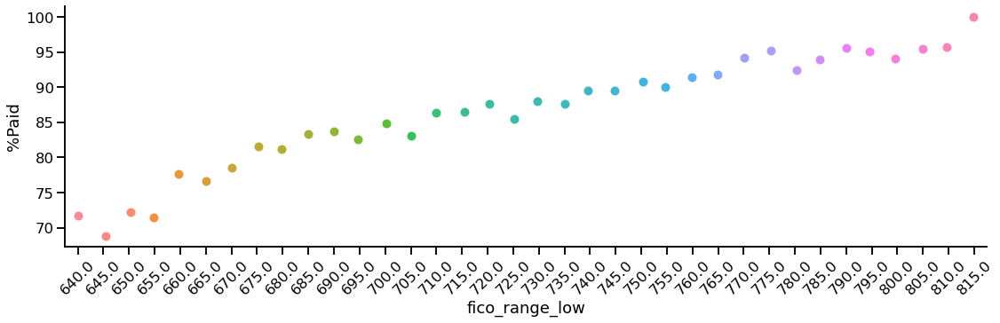

In [43]:
#The higer fico_range is the bigger chance that the loan will be fully paid, but correlation is so low that we can assume that other varibles are more important
pearson_coeff('fico_range_low')
chance_of_paid('fico_range_low', 16)

### W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO

,Coeff,P-val,Summary,Corr
0,-0.024498,0.0,sign,negligible


,earliest_cr_line,sum,Paid,UnPaid,%Paid
11,1969,29,26,3.0,89.66
12,1970,36,31,5.0,86.11
13,1971,43,36,7.0,83.72
14,1972,43,36,7.0,83.72
15,1973,51,41,10.0,80.39
16,1974,56,50,6.0,89.29
17,1975,70,63,7.0,90.00
18,1976,91,83,8.0,91.21
19,1977,103,92,11.0,89.32
20,1978,140,124,16.0,88.57


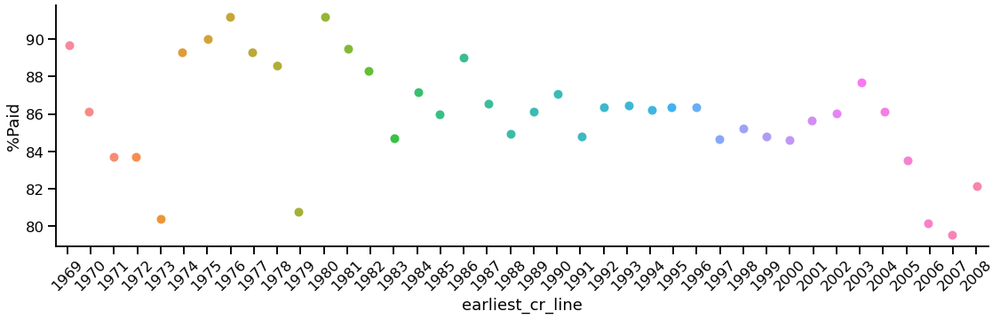

In [44]:
#The credit age seems to not have influence of paiment
pearson_coeff('earliest_cr_line')
chance_of_paid('earliest_cr_line', 16)

In [45]:
pearson_coeff('fico_range_low', 'earliest_cr_line')

,Coeff,P-val,Summary,Corr
0,-0.234949,0.0,sign,negligible


p value is 0.0
Dependent (reject H0)


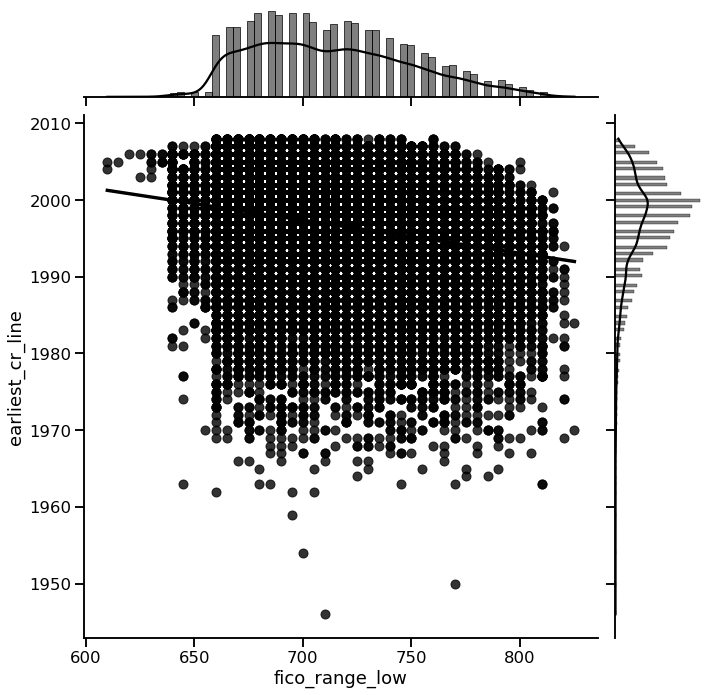

In [46]:
chi2_test('fico_range_low', 'earliest_cr_line')
sns.jointplot(data=df, x='fico_range_low', y='earliest_cr_line', color="k",
              kind="reg", height=10)

### W jaki sposób status kredytu hipotecznego na dom wiąże się z prawdopodobieństwem niewypłacalności?

In [47]:
def segmended_bar(col1, col2='loan_status'):
    data1 = df[col1][df[col1].isin(
        df[col1].value_counts()[df[col1].value_counts() > 20].index)]
    if len(data1) == 0: data1 = df[col1]
    cross_tab = pd.crosstab(index=data1.sort_values(), columns=df[col2],
                            normalize="index")
    cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Blues')

    plt.legend(loc="upper left", ncol=2)
    plt.xlabel(col1)
    plt.ylabel("%Chance")
    plt.axhline(y=0.20, color='y', linestyle='-')
    plt.show()

,Coeff,P-val,Summary,Corr
0,-0.022772,0.0,sign,negligible


<AxesSubplot:xlabel='home_ownership', ylabel='count'>

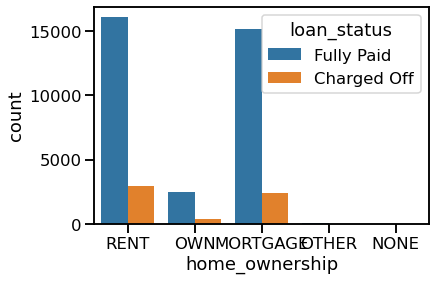

In [48]:
pearson_coeff('home_ownership')
sns.countplot(x='home_ownership', data=df, hue='loan_status')

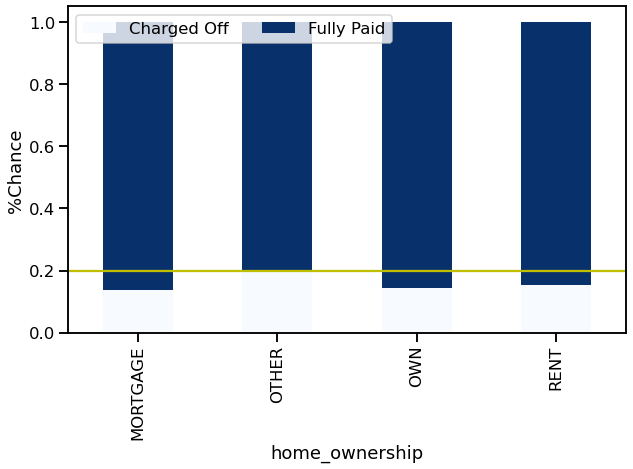

In [49]:
#It seams that it doesn't have an influence
segmended_bar('home_ownership')

### W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?

,annual_inc,sum,Paid,UnPaid,%Paid
27,9600.0,23,17.0,6.0,73.91
31,10000.0,23,18.0,5.0,78.26
50,12000.0,77,54.0,23.0,70.13
79,14400.0,89,67.0,22.0,75.28
87,15000.0,70,49.0,21.0,70.00
...,...,...,...,...,...
4997,220000.0,22,18.0,4.0,81.82
5002,225000.0,37,32.0,5.0,86.49
5020,240000.0,27,24.0,3.0,88.89
5034,250000.0,52,45.0,7.0,86.54


,Coeff,P-val,Summary,Corr
0,0.034997,0.0,sign,negligible


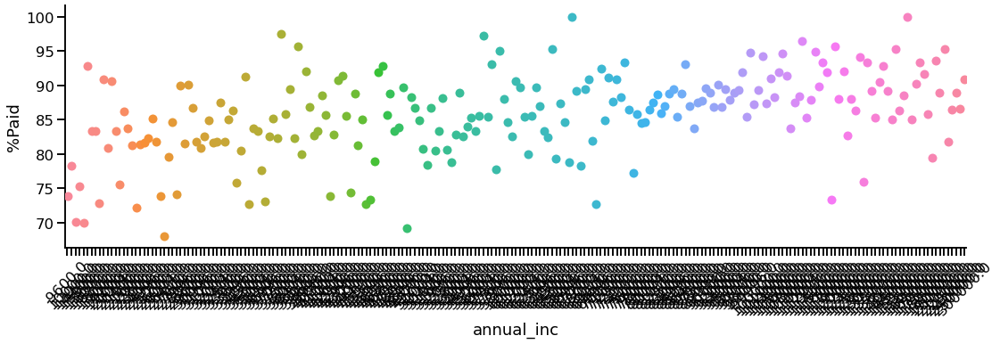

In [50]:
# As we can see, not much.
chance_of_paid('annual_inc', 16)
pearson_coeff('annual_inc')

### W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?

,emp_length,sum,Paid,UnPaid,%Paid
0,0.0,4887,4184,703,85.61
1,1.0,3481,2956,525,84.92
2,2.0,4584,3963,621,86.45
3,3.0,4208,3624,584,86.12
4,4.0,3512,3026,486,86.16
5,5.0,3323,2853,470,85.86
6,6.0,2265,1928,337,85.12
7,7.0,1777,1501,276,84.47
8,8.0,1503,1284,219,85.43
9,9.0,1268,1099,169,86.67


,Coeff,P-val,Summary,Corr
0,-0.012429,0.01,sign,negligible


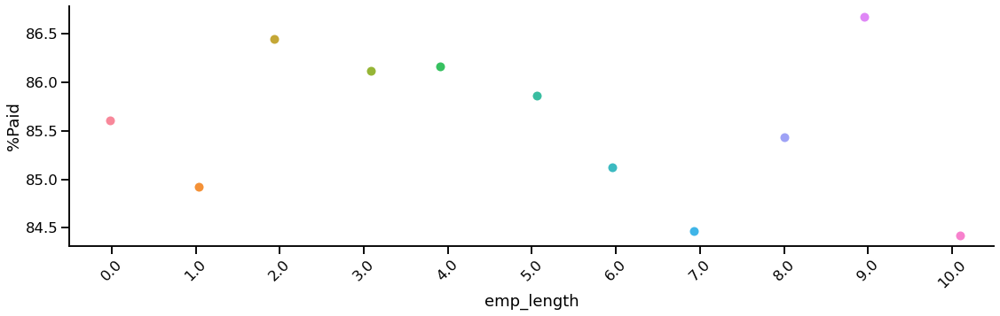

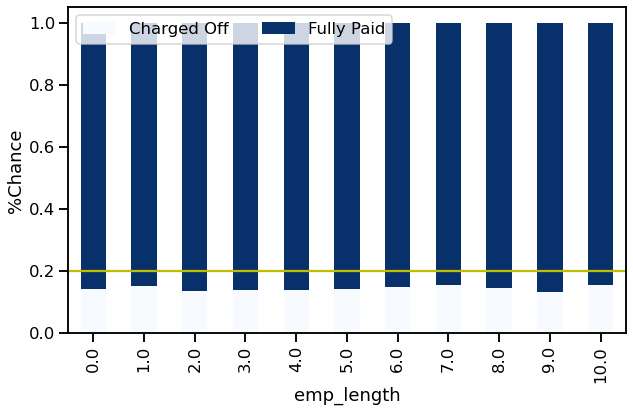

In [51]:
# Same as above
chance_of_paid('emp_length', 16)
pearson_coeff('emp_length')
segmended_bar('emp_length')

### Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?

,loan_amnt,sum,Paid,UnPaid,%Paid
11,1000.0,269,235.0,34.0,87.36
17,1200.0,129,110.0,19.0,85.27
24,1400.0,45,37.0,8.0,82.22
28,1500.0,299,255.0,44.0,85.28
31,1600.0,91,76.0,15.0,83.52
...,...,...,...,...,...
810,27000.0,24,19.0,5.0,79.17
821,28000.0,145,131.0,14.0,90.34
842,30000.0,370,300.0,70.0,81.08
863,32000.0,29,23.0,6.0,79.31


,Coeff,P-val,Summary,Corr
0,-0.04492,0.0,sign,negligible


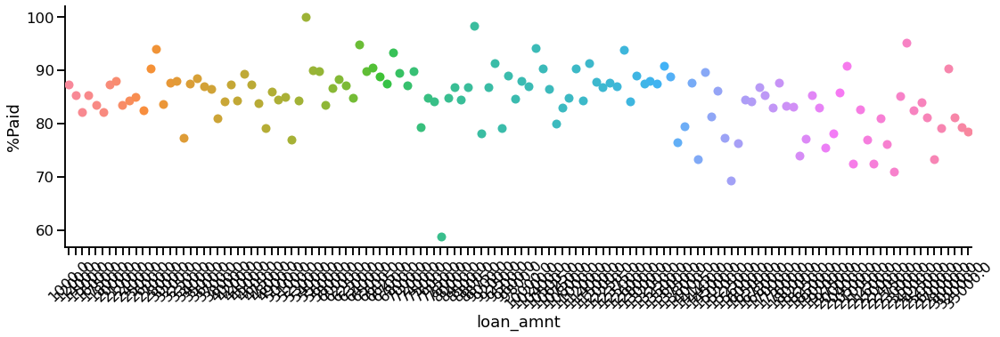

In [52]:
#Same as above
chance_of_paid('loan_amnt', 16)
pearson_coeff('loan_amnt')

## Modeling to find the moste importnat varibles

Text(0.5, 0, 'Importance')

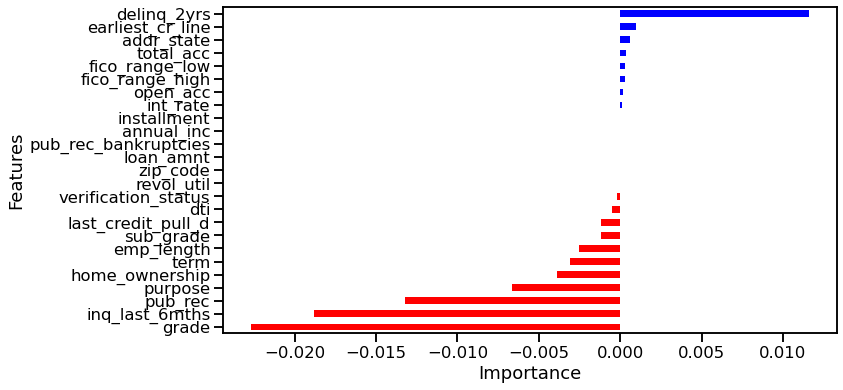

In [53]:
X_train, X_test, y_train, y_test = train_test_split(
    df_numeric.dropna().drop(columns='loan_status'),
    df_numeric.dropna()['loan_status'], test_size=0.7, random_state=0)
model = LinearRegression()
model.fit(X_train, y_train)
coeff = model.coef_.T
labels = list(X_train.columns)
features = pd.DataFrame()
features['Features'] = labels
features['importance'] = coeff
features.sort_values(by=['importance'], ascending=True, inplace=True)
features['positive'] = features['importance'] > 0
features.set_index('Features', inplace=True)
features.importance.plot(kind='barh', figsize=(11, 6),
                         color=features.positive.map(
                             {True: 'blue', False: 'red'}))
plt.xlabel('Importance')

# Feature Engineering – utwórz 20 nowych zmiennych

In [54]:
df['month_income'] = df['annual_inc'] / 12
df['salary_without_installment'] = (
        df['month_income'] - df['installment']).astype(int)
df['loan_size'] = round(df['loan_amnt'] / df['annual_inc'] * 100, 2)
df['loan_as_sallary'] = round(df['loan_amnt'] / df['month_income'], 2)
df['installment_yearly'] = df['installment'] * 12
df['loan_cost_pre_mont'] = round(df['installment'] / df['month_income'], 2)
df['loan_cost'] = (df['installment'] * df['term']) - df['loan_amnt']
df['loan_per'] = round(df['installment'] / (df['loan_amnt'] / df['term']), 2)
df['loan_age'] = 2022 - df['earliest_cr_line']
df['paid_acc'] = df['total_acc'] - df['open_acc']
df['per_paid_loan'] = round(df['paid_acc'] / df['total_acc'] * 100, 2)
df[df['total_acc'] == 0]['per_paid_loan'] = 100
df['income_per_credit'] = df['month_income'] / df['open_acc']

In [55]:
df['last_credit_pull_d'] = pd.to_datetime(df['last_credit_pull_d'])
df['last_credit_pull_year'] = df['last_credit_pull_d'].dt.year
df['since_last_credit'] = 2022 - df['last_credit_pull_year']
df['last_credit_pull_d'] = df['last_credit_pull_d'].astype(str)

In [56]:
# Changing categorical data into numeric
le = LabelEncoder()
# passing bridge-types-cat column (label encoded values of bridge_types)
df_numeric = df.copy()
for column in df.select_dtypes(object):
    le.fit(df_numeric[column].unique().tolist())
    df_numeric[column][df_numeric[column].notna()] = le.transform(
        df_numeric[column])


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [57]:
df['since_last_credit'].value_counts().sort_index()

4     12934
5      4631
6      6859
7      2692
8      3675
9      3311
10     2703
11     1704
12      750
13      241
14       53
15       44
Name: since_last_credit, dtype: int64

In [58]:
df['term'].value_counts().sort_index(ascending=True)

36    29390
60    10207
Name: term, dtype: int64

In [59]:
df_numeric.astype(float).corr()['loan_status'].sort_values()

last_credit_pull_d           -0.205417
sub_grade                    -0.199915
grade                        -0.196516
int_rate                     -0.195878
last_credit_pull_year        -0.183793
loan_per                     -0.152691
term                         -0.131916
loan_cost                    -0.110688
inq_last_6mths               -0.106467
loan_as_sallary              -0.099805
loan_size                    -0.099802
loan_cost_pre_mont           -0.076109
revol_util                   -0.072183
purpose                      -0.049172
loan_amnt                    -0.044920
dti                          -0.037147
verification_status          -0.029637
earliest_cr_line             -0.024498
installment                  -0.023548
installment_yearly           -0.023548
pub_rec                      -0.022941
home_ownership               -0.022772
delinq_2yrs                  -0.018297
zip_code                     -0.016808
emp_length                   -0.012429
open_acc                 

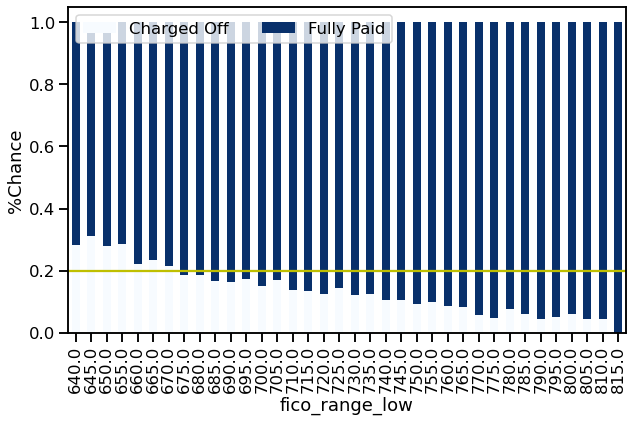

In [60]:
segmended_bar('fico_range_low')

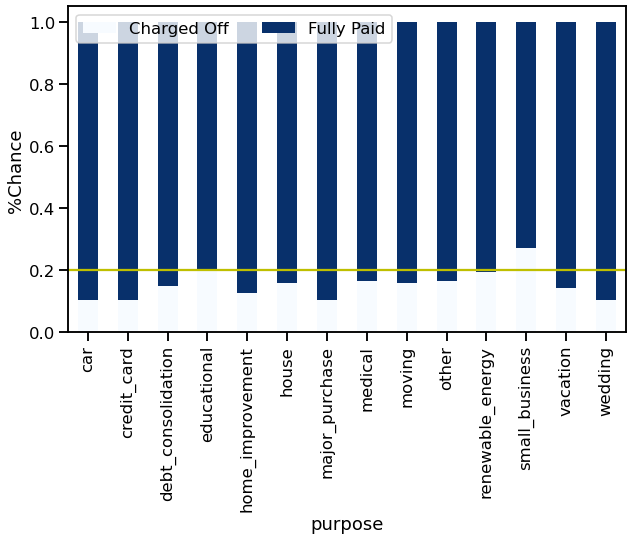

In [61]:
segmended_bar('purpose')

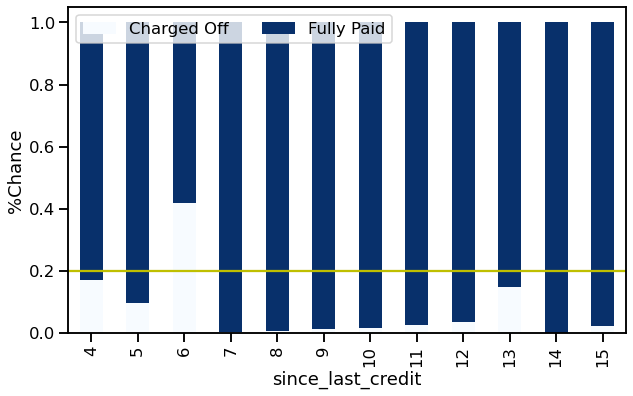

In [62]:
segmended_bar('since_last_credit')

In [63]:
pearson_coeff('loan_cost_pre_mont')
pearson_coeff('loan_as_sallary')
pearson_coeff('per_paid_loan')
pearson_coeff('delinq_2yrs')
pearson_coeff('grade')
pearson_coeff('purpose')
pearson_coeff('since_last_credit')
pearson_coeff('fico_range_low')

,Coeff,P-val,Summary,Corr
0,-0.076109,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,-0.099805,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,0.032568,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,-0.018297,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,-0.196516,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,-0.049172,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,0.183793,0.0,sign,negligible


,Coeff,P-val,Summary,Corr
0,0.137717,0.0,sign,negligible


In [64]:
# for column in df:
#     print(column)
#     segmended_bar(column)

In [65]:
col = 'loan_per'
grade = pd.concat([df.groupby(col)[col].count().rename(index='sum'),
                   df[df['loan_status'] == 'Fully Paid'].groupby(col)[
                       col].count().rename(index='Paid'),
                   df[df['loan_status'] == 'Charged Off'].groupby(col)[
                       col].count().rename(index='UnPaid')],
                  axis=1).reset_index()
grade = grade[grade['sum'] > 20]
grade['%Paid'] = round(grade['Paid'] / grade['sum'] * 100, 2)
grade.sort_values(by=col)

,loan_per,sum,Paid,UnPaid,%Paid
46,0.67,33,31.0,2.0,93.94
47,0.68,38,36.0,2.0,94.74
48,0.69,37,33.0,4.0,89.19
49,0.70,38,36.0,2.0,94.74
50,0.71,29,26.0,3.0,89.66
...,...,...,...,...,...
142,1.63,59,34.0,25.0,57.63
143,1.64,37,24.0,13.0,64.86
144,1.65,54,31.0,23.0,57.41
145,1.66,56,38.0,18.0,67.86


In [66]:
# Each of that plots helped me to find the value where a change of paid loan
# was lower than 80% and made them as a worring.
# If I wasnt sure about the value, I put the name of the column to the column above to get detailed information.
for index in df.index:
    worrning = 0
    if df.at[index, 'loan_cost_pre_mont'] >= 0.15: worrning += 1
    if df.at[index, 'loan_as_sallary'] >= 12: worrning += 1
    if df.at[index, 'per_paid_loan'] <= 30: worrning += 1
    if df.at[index, 'delinq_2yrs'] > 0: worrning += 1
    if df.at[index, 'grade'] in (('D', 'E', 'F', 'G')): worrning += 1
    if df.at[index, 'purpose'] in (
            ('small_business', 'educational')): worrning += 1
    if df.at[index, 'since_last_credit'] < 7: worrning += 1
    if df.at[index, 'fico_range_low'] < 675: worrning += 1
    if df.at[index, 'home_ownership'] == 'OTHER': worrning += 1
    if df.at[index, 'inq_last_6mths'] > 2: worrning += 1
    if float(df.at[index, 'int_rate']) > 16: worrning += 1
    if df.at[index, 'pub_rec'] > 0: worrning += 1
    if df.at[index, 'term'] == 60: worrning += 1
    if df.at[index, 'loan_per'] > 1.4: worrning += 1

    df.at[index, 'num_of_worrnings'] = worrning


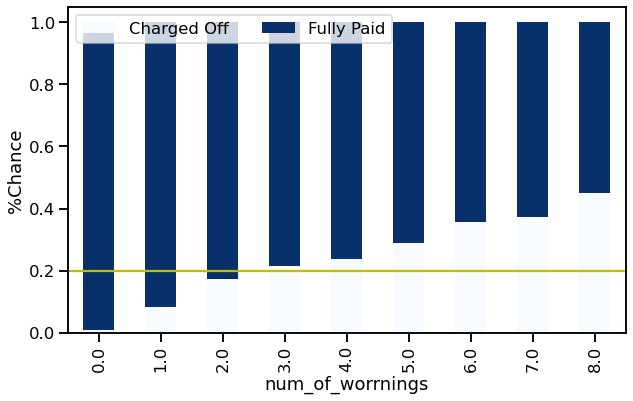

In [67]:
segmended_bar('num_of_worrnings')

In [68]:
df_numeric['num_of_worrnings'] = df['num_of_worrnings']
pearson_coeff('num_of_worrnings')

,Coeff,P-val,Summary,Corr
0,-0.273267,0.0,sign,negligible


# Modelowanie

In [69]:
X = df_numeric.astype(float).drop(columns='loan_status')
y = df_numeric.astype(float).loan_status
X_train, X_test, y_train, y_test = train_test_split(
    df_numeric.astype(float).drop(columns='loan_status'),
    df_numeric.astype(int)['loan_status'], test_size=0.7, random_state=0)

### Wykonaj klasteryzację danych (wypróbuj do tego celu kilka metod, min. 3) i sprawdź, czy występują jakieś segmenty pożyczkobiorców, wykorzystaj odpowiednie metody do określenia optymalnej liczby klastrów

In [70]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled

array([[-0.83489673, -0.5893174 , -0.55089076, ...,  0.99805361,
        -0.99805361, -0.5960837 ],
       [-1.17037485,  1.69687846,  0.92674204, ...,  0.16613392,
        -0.16613392,  1.69437008],
       [-1.18379397, -0.5893174 ,  1.11273778, ...,  0.58209377,
        -0.58209377, -0.02347025],
       ...,
       [-1.23747047, -0.5893174 , -1.21220894, ..., -2.32962515,
         2.32962515, -1.16869714],
       [-0.70070548, -0.5893174 , -0.58189005, ..., -0.66578577,
         0.66578577, -0.02347025],
       [-0.91541148, -0.5893174 , -0.81955127, ...,  0.99805361,
        -0.99805361, -0.02347025]])

In [71]:
range_n_clusters = [2, 4, 6, 8, 10, 12]
for num_clusters in range_n_clusters:
    klaster = KMeans(n_clusters=num_clusters, max_iter=1000)
    cluster_labels = klaster.fit_predict(X)

    # silhouette score
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters,
                                                                   silhouette_avg))

For n_clusters=2, the silhouette score is 0.9416212481038859
For n_clusters=4, the silhouette score is 0.6133629552326153
For n_clusters=6, the silhouette score is 0.48790381942510586
For n_clusters=8, the silhouette score is 0.4451152884422647
For n_clusters=10, the silhouette score is 0.4260768372391867
For n_clusters=12, the silhouette score is 0.38453179164045015


In [72]:
klaster = DBSCAN(eps=0.5, metric='euclidean', min_samples=5, n_jobs=-1)
clt = DBSCAN(eps=0.5, metric='euclidean', min_samples=5, n_jobs=-1)
pca = PCA(n_components=2).fit(X_scaled)
pca_2d = pca.transform(X_scaled)
model = klaster.fit(pca_2d)
model.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [73]:
# klaster = AgglomerativeClustering(n_clusters=2, affinity='euclidean')
# klaster.fit(X_scaled)
# plt.figure(figsize=(6, 6))
# plt.scatter(pca_2d[0], pca_2d[1], c=klaster.labels_,
#             cmap=matplotlib.colors.ListedColormap(colors), s=15)
# plt.title('Hierarchical Clustering', fontsize=20)
# plt.xlabel('Feature 1', fontsize=14)
# plt.ylabel('Feature 2', fontsize=14)
# plt.show()

In [74]:
# clt = DBSCAN(eps=0.5, metric='euclidean', min_samples=5, n_jobs=-1)
# model = clt.fit(X_test_scaled)
# pca = PCA(n_components=2).fit(X)
# pca_2d = pca.transform(X)
# for i in range(0, pca_2d.shape[0]):
#     if clt.labels_[i] == 0:
#         c1 = plt.scatter(pca_2d[i, 0], pca_2d[i, 1], c='r', marker='+')
#     elif clt.labels_[i] == 1:
#         c2 = plt.scatter(pca_2d[i, 0], pca_2d[i, 1], c='g', marker='o')
#     elif clt.labels_[i] == -1:
#         c3 = plt.scatter(pca_2d[i, 0], pca_2d[i, 1], c='b', marker='*')
# plt.legend([c1, c2, c3], ['Cluster 1', 'Cluster 2', 'Noise'])
# plt.title('DBSCAN finds 2 clusters and noise')
# plt.show()

For n_clusters=2, the silhouette score is 0.7288641825982329
For n_clusters=4, the silhouette score is 0.6133629552326153
For n_clusters=6, the silhouette score is 0.48783643400269144
For n_clusters=8, the silhouette score is 0.4488528441480461
For n_clusters=10, the silhouette score is 0.4245272111792017
For n_clusters=12, the silhouette score is 0.38839682843414247


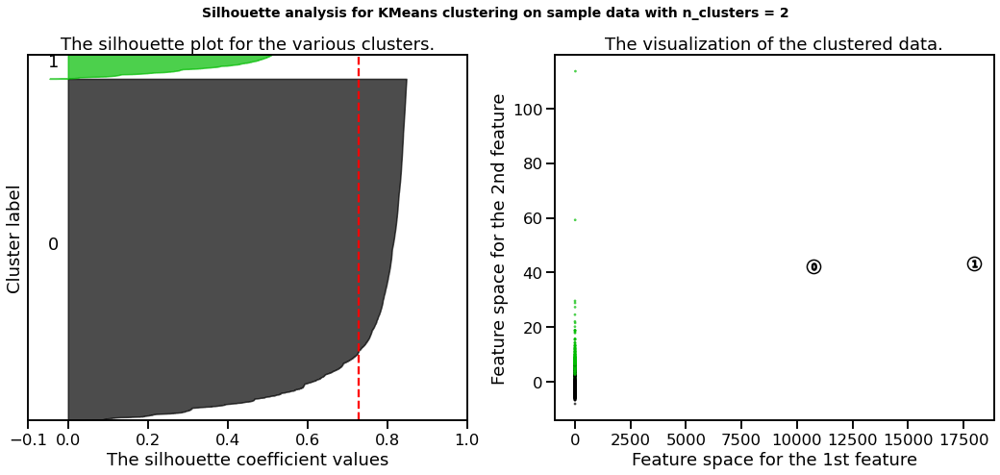

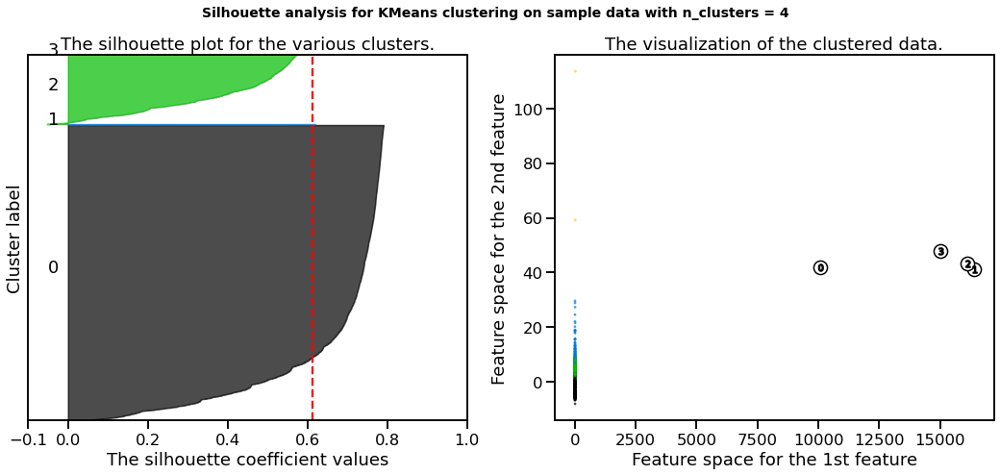

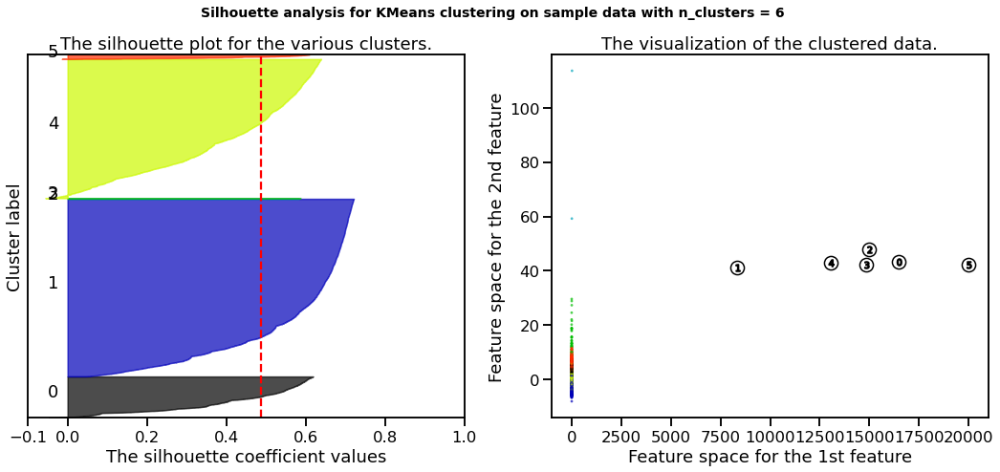

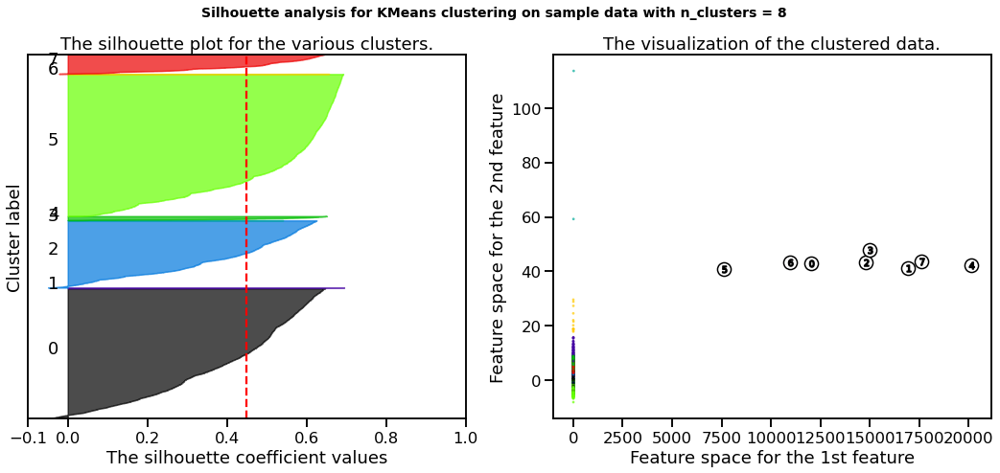

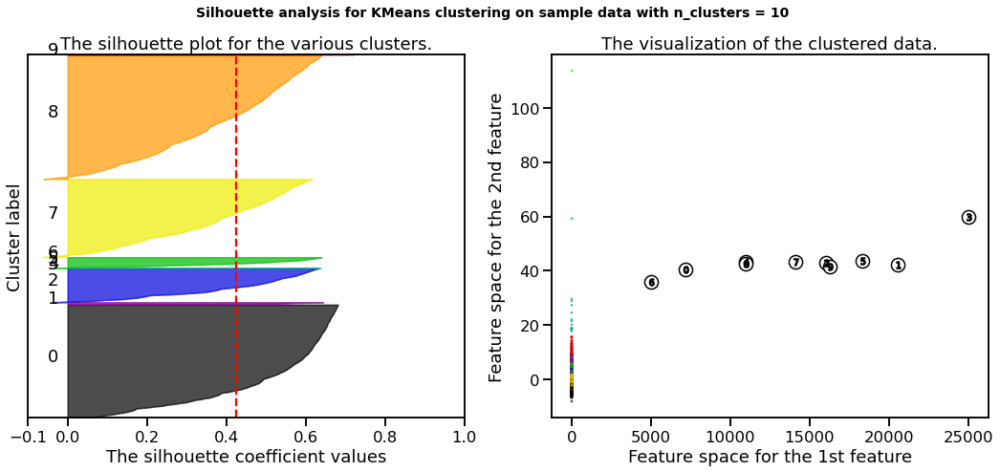

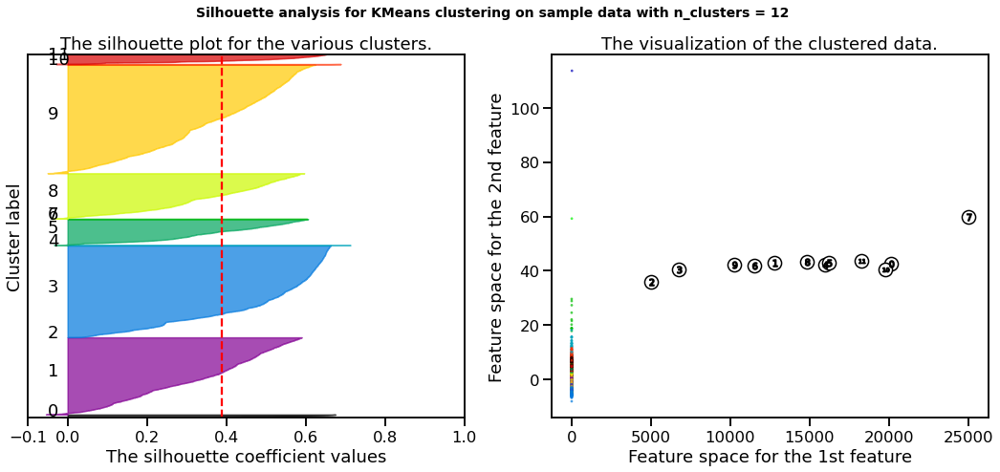

In [75]:
ssd = []  # Sum of squared distances
range_n_clusters = [2, 4, 6, 8, 10, 12]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    cluster_labels = kmeans.fit_predict(X)

    # silhouette score
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters,
                                                                   silhouette_avg))

    ssd.append(kmeans.inertia_)  #Sum of squared distances

    # Visualization
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (num_clusters + 1) * 10])
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(num_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[
            cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / num_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0,
                          ith_cluster_silhouette_values, facecolor=color,
                          edgecolor=color, alpha=0.7, )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / num_clusters)
    ax2.scatter(pca_2d[:, 0], pca_2d[:, 1], marker=".", s=30, lw=0, alpha=0.7,
                c=colors, edgecolor="k")

    # Labeling the clusters
    centers = kmeans.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white", alpha=1,
                s=200, edgecolor="k", )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % num_clusters,
        fontsize=14, fontweight="bold", )

plt.show()

# # plot the SSDs for each n_clusters
# # ssd
# plt.plot(ssd)
# plt.show()

### Wytrenuj 5 różnych modeli, wykorzystując do każdego inny algorytm, a następnie porównaj ich działanie, za metrykę oceny jakości modelu przyjmij AUROC score.

In [76]:
def model_validation():
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average="weighted")
    recall = recall_score(y_test, y_pred, average="weighted")
    f1 = f1_score(y_test, y_pred, average="weighted")
    y_score2 = model.predict_proba(X_test)[:, 1]
    false_positive_rate2, true_positive_rate2, threshold2 = roc_curve(y_test,
                                                                      y_score2)
    roc_score = roc_auc_score(y_test, y_score2)
    model_results = pd.DataFrame([{'accuracy': accuracy, 'precision': precision,
                                   'recall': recall, 'f1': f1,
                                   'AUROC': roc_score}], index=[str(model)])
    plt.subplots(1, figsize=(8, 6))
    plt.title('Receiver Operating Characteristic')
    plt.plot(false_positive_rate2, true_positive_rate2)
    plt.plot([0, 1], ls="--")
    plt.plot([0, 0], [1, 0], c=".7"), plt.plot([1, 1], c=".7")
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    display(model_results)
    return model_results

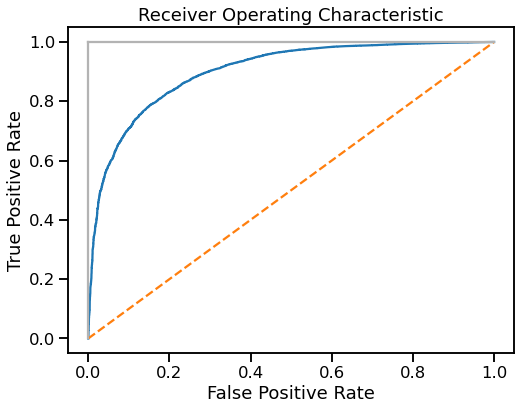

,accuracy,precision,recall,f1,AUROC
AdaBoostClassifier(learning_rate=1),0.90223,0.893951,0.90223,0.8947,0.901004


In [77]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)
model = abc.fit(X_train, y_train)
y_pred = model.predict(X_test)
Ada_results = model_validation()

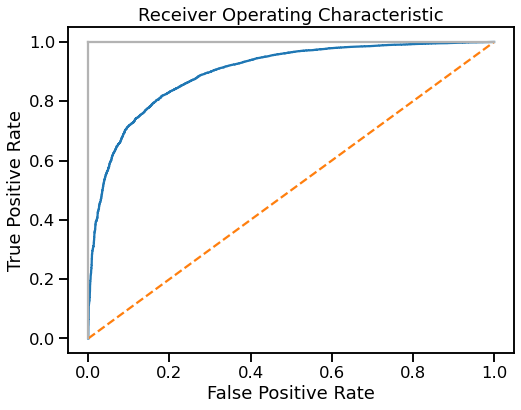

,accuracy,precision,recall,f1,AUROC
"XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,\n colsample_bynode=1, colsample_bytree=1, enable_categorical=False,\n eval_metric='logloss', gamma=0, gpu_id=-1, importance_type=None,\n interaction_constraints='', learning_rate=0.300000012,\n max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,\n monotone_constraints='()', n_estimators=100, n_jobs=8,\n num_parallel_tree=1, predictor='auto', random_state=0,\n reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,\n tree_method='exact', use_label_encoder=False,\n validate_parameters=1, verbosity=None)",0.897503,0.888862,0.897503,0.890647,0.898699


In [78]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
model = xgb.fit(X_train, y_train)
y_pred = model.predict(X_test)
xgb_results = model_validation()

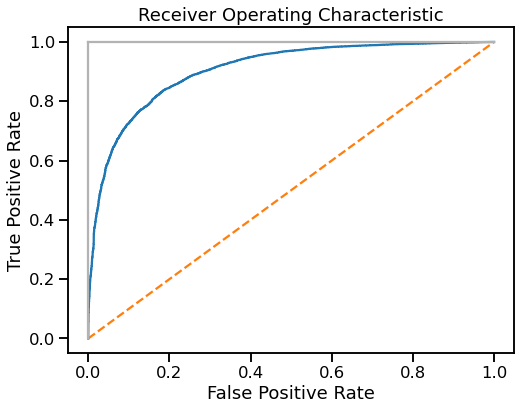

,accuracy,precision,recall,f1,AUROC
LGBMClassifier(),0.902626,0.894612,0.902626,0.895651,0.905947


In [79]:
lgb = LGBMClassifier()
model = lgb.fit(X_train, y_train)
y_pred = model.predict(X_test)
lgmc_results = model_validation()

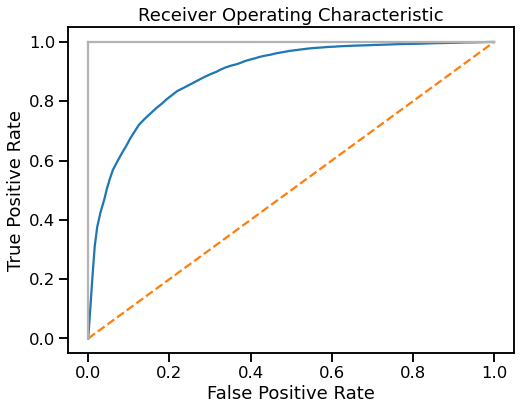

,accuracy,precision,recall,f1,AUROC
RandomForestClassifier(),0.902338,0.894315,0.902338,0.890831,0.89058


In [80]:
cbc = RandomForestClassifier(n_estimators=100)  # Best Results
model = cbc.fit(X_train, y_train)
y_pred = model.predict(X_test)
forest_results = model_validation()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

You should provide test set for use best model. use_best_model parameter has been switched to false value.


Learning rate set to 0.029639
0:	learn: 0.6574889	total: 80.2ms	remaining: 1m 20s
1:	learn: 0.6236177	total: 93.8ms	remaining: 46.8s
2:	learn: 0.5932654	total: 107ms	remaining: 35.7s
3:	learn: 0.5622900	total: 120ms	remaining: 29.8s
4:	learn: 0.5370271	total: 130ms	remaining: 26s
5:	learn: 0.5135933	total: 142ms	remaining: 23.5s
6:	learn: 0.4942769	total: 152ms	remaining: 21.6s
7:	learn: 0.4745778	total: 161ms	remaining: 20s
8:	learn: 0.4571938	total: 168ms	remaining: 18.5s
9:	learn: 0.4435709	total: 177ms	remaining: 17.6s
10:	learn: 0.4363925	total: 194ms	remaining: 17.5s
11:	learn: 0.4223858	total: 205ms	remaining: 16.9s
12:	learn: 0.4090054	total: 213ms	remaining: 16.2s
13:	learn: 0.3969816	total: 220ms	remaining: 15.5s
14:	learn: 0.3855453	total: 228ms	remaining: 15s
15:	learn: 0.3745552	total: 237ms	remaining: 14.6s
16:	learn: 0.3656324	total: 244ms	remaining: 14.1s
17:	learn: 0.3576359	total: 252ms	remaining: 13.7s
18:	learn: 0.3495871	total: 260ms	remaining: 13.4s
19:	learn: 0.3

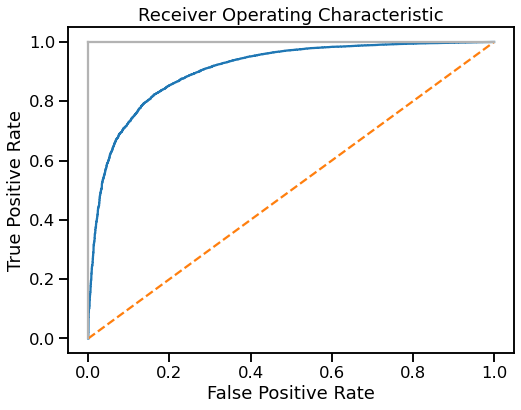

,accuracy,precision,recall,f1,AUROC
<catboost.core.CatBoostClassifier object at 0x7fabfe362910>,0.904358,0.896505,0.904358,0.897044,0.907807


In [81]:
cbc = CatBoostClassifier()  # Best Results
model = cbc.fit(X_train, y_train, plot=True, use_best_model=True)
y_pred = model.predict(X_test)
cat_results = model_validation()

In [82]:
model_summary = pd.concat(
    [cat_results, forest_results, lgmc_results, xgb_results, Ada_results])
model_summary.sort_values(by='AUROC')

,accuracy,precision,recall,f1,AUROC
RandomForestClassifier(),0.902338,0.894315,0.902338,0.890831,0.890580
"XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,\n colsample_bynode=1, colsample_bytree=1, enable_categorical=False,\n eval_metric='logloss', gamma=0, gpu_id=-1, importance_type=None,\n interaction_constraints='', learning_rate=0.300000012,\n max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,\n monotone_constraints='()', n_estimators=100, n_jobs=8,\n num_parallel_tree=1, predictor='auto', random_state=0,\n reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,\n tree_method='exact', use_label_encoder=False,\n validate_parameters=1, verbosity=None)",0.897503,0.888862,0.897503,0.890647,0.898699
AdaBoostClassifier(learning_rate=1),0.902230,0.893951,0.902230,0.894700,0.901004
LGBMClassifier(),0.902626,0.894612,0.902626,0.895651,0.905947
<catboost.core.CatBoostClassifier object at 0x7fabfe362910>,0.904358,0.896505,0.904358,0.897044,0.907807


### Sprawdź działanie wcześniej użytych metod na skompresowanych danych za pomocą PCA, porównaj wyniki (AUROC score) z modelami wytrenowanymi w poprzednim podpunkcie

In [83]:
X_train, X_test, y_train, y_test = train_test_split(
    df_numeric.astype(float).drop(columns='loan_status'),
    df_numeric.astype(int)['loan_status'], test_size=0.7, random_state=0)

In [84]:
pca = PCA(n_components=2)
pca.fit(X_test)
pca_df = pd.DataFrame({'PC1': pca.components_[0], 'PC2': pca.components_[1],
                       'Feature': X_train.columns.tolist()})
pca_df

,PC1,PC2,Feature
0,3.929042e-02,-9.027013e-01,loan_amnt
1,9.662693e-06,-5.035717e-04,term
2,9.966309e-05,-4.113824e-03,int_rate
3,1.106580e-03,-2.394790e-02,installment
4,1.396809e-06,-5.394428e-05,grade
5,6.981660e-06,-2.736588e-04,sub_grade
6,7.673914e-06,-5.756969e-05,emp_length
7,-7.482313e-06,2.693172e-05,home_ownership
8,9.922767e-01,4.041134e-02,annual_inc
9,2.123795e-06,-4.334613e-05,verification_status


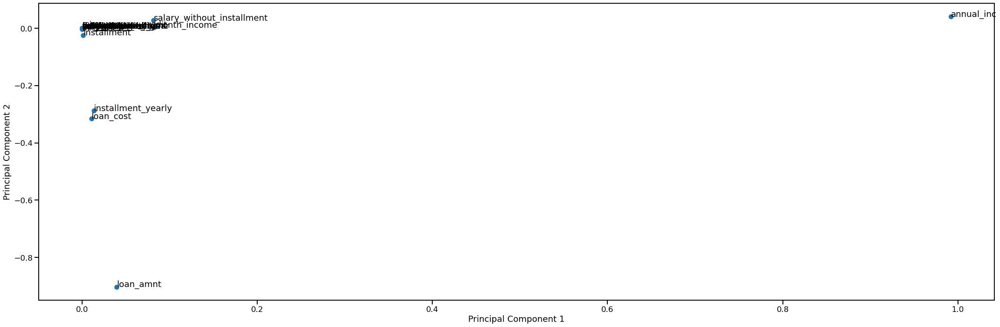

In [85]:
fig = plt.figure(figsize=(30, 10))
plt.scatter(pca_df.PC1, pca_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pca_df.Feature):
    plt.annotate(txt, (pca_df.PC1[i], pca_df.PC2[i]))
plt.tight_layout()
plt.show()

In [86]:
X_pca = pca.transform(X_train)
X_pca

array([[-38804.16632514, -14637.15673088],
       [-23473.22125921,   6167.51901921],
       [ 76523.40962984,  11056.8554715 ],
       ...,
       [-26311.45277443,   -390.11840769],
       [  5477.65945057,   -729.23349426],
       [-14476.21385874,  -1419.89193452]])

In [87]:
pca.explained_variance_ratio_

array([0.98102026, 0.01696549])

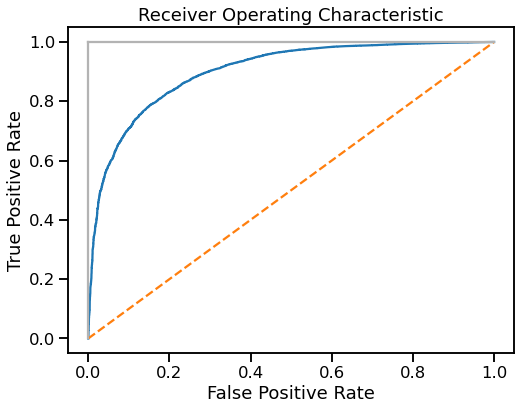

,accuracy,precision,recall,f1,AUROC
AdaBoostClassifier(learning_rate=1),0.90223,0.893951,0.90223,0.8947,0.901004


In [88]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)
model = abc.fit(X_train, y_train)
y_pred = model.predict(X_test)
Ada_results = model_validation()

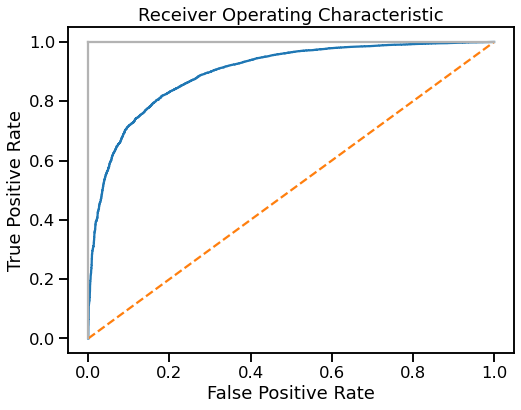

,accuracy,precision,recall,f1,AUROC
"XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,\n colsample_bynode=1, colsample_bytree=1, enable_categorical=False,\n eval_metric='logloss', gamma=0, gpu_id=-1, importance_type=None,\n interaction_constraints='', learning_rate=0.300000012,\n max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,\n monotone_constraints='()', n_estimators=100, n_jobs=8,\n num_parallel_tree=1, predictor='auto', random_state=0,\n reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,\n tree_method='exact', use_label_encoder=False,\n validate_parameters=1, verbosity=None)",0.897503,0.888862,0.897503,0.890647,0.898699


In [89]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
model = xgb.fit(X_train, y_train)
y_pred = model.predict(X_test)
xgb_results = model_validation()

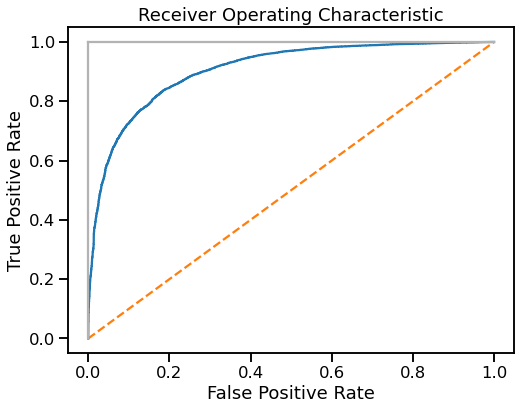

,accuracy,precision,recall,f1,AUROC
LGBMClassifier(),0.902626,0.894612,0.902626,0.895651,0.905947


In [90]:
lgb = LGBMClassifier()
model = lgb.fit(X_train, y_train)
y_pred = model.predict(X_test)
lgmc_results = model_validation()

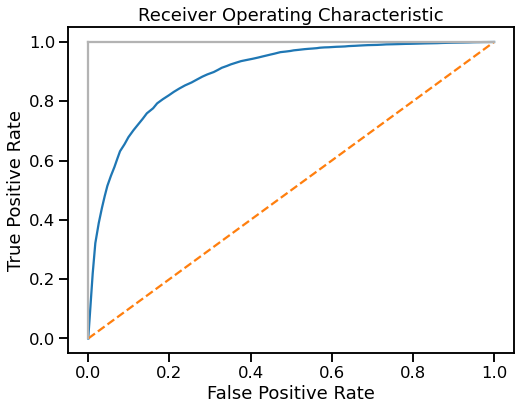

,accuracy,precision,recall,f1,AUROC
RandomForestClassifier(),0.901652,0.893177,0.901652,0.890708,0.892712


In [91]:
cbc = RandomForestClassifier(n_estimators=100)  # Best Results
model = cbc.fit(X_train, y_train)
y_pred = model.predict(X_test)
forest_results = model_validation()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

You should provide test set for use best model. use_best_model parameter has been switched to false value.


Learning rate set to 0.029639
0:	learn: 0.6574889	total: 6.05ms	remaining: 6.05s
1:	learn: 0.6236177	total: 15.4ms	remaining: 7.67s
2:	learn: 0.5932654	total: 21ms	remaining: 6.98s
3:	learn: 0.5622900	total: 27.3ms	remaining: 6.79s
4:	learn: 0.5370271	total: 32.7ms	remaining: 6.5s
5:	learn: 0.5135933	total: 38.8ms	remaining: 6.43s
6:	learn: 0.4942769	total: 44.8ms	remaining: 6.36s
7:	learn: 0.4745778	total: 50.6ms	remaining: 6.28s
8:	learn: 0.4571938	total: 58.3ms	remaining: 6.42s
9:	learn: 0.4435709	total: 65.4ms	remaining: 6.47s
10:	learn: 0.4363925	total: 71.9ms	remaining: 6.46s
11:	learn: 0.4223858	total: 79.5ms	remaining: 6.54s
12:	learn: 0.4090054	total: 86.7ms	remaining: 6.58s
13:	learn: 0.3969816	total: 93.6ms	remaining: 6.59s
14:	learn: 0.3855453	total: 101ms	remaining: 6.63s
15:	learn: 0.3745552	total: 108ms	remaining: 6.66s
16:	learn: 0.3656324	total: 114ms	remaining: 6.61s
17:	learn: 0.3576359	total: 122ms	remaining: 6.66s
18:	learn: 0.3495871	total: 128ms	remaining: 6.61s


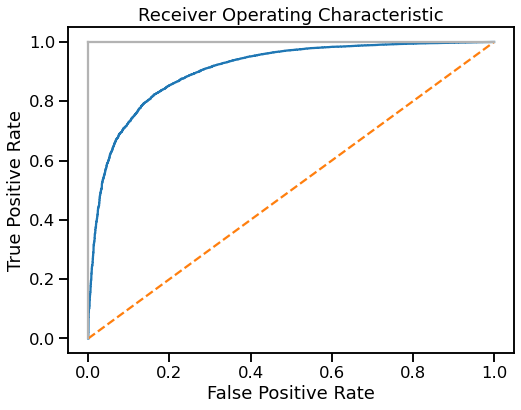

,accuracy,precision,recall,f1,AUROC
<catboost.core.CatBoostClassifier object at 0x7fabfe31d940>,0.904358,0.896505,0.904358,0.897044,0.907807


In [92]:
cbc = CatBoostClassifier()  # Best Results
model = cbc.fit(X_train, y_train, plot=True, use_best_model=True)
y_pred = model.predict(X_test)
cat_results = model_validation()

In [93]:
model_summary_pca = pd.concat(
    [cat_results, forest_results, lgmc_results, xgb_results, Ada_results])
model_summary_pca.sort_values(by='AUROC')

,accuracy,precision,recall,f1,AUROC
RandomForestClassifier(),0.901652,0.893177,0.901652,0.890708,0.892712
"XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,\n colsample_bynode=1, colsample_bytree=1, enable_categorical=False,\n eval_metric='logloss', gamma=0, gpu_id=-1, importance_type=None,\n interaction_constraints='', learning_rate=0.300000012,\n max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,\n monotone_constraints='()', n_estimators=100, n_jobs=8,\n num_parallel_tree=1, predictor='auto', random_state=0,\n reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,\n tree_method='exact', use_label_encoder=False,\n validate_parameters=1, verbosity=None)",0.897503,0.888862,0.897503,0.890647,0.898699
AdaBoostClassifier(learning_rate=1),0.902230,0.893951,0.902230,0.894700,0.901004
LGBMClassifier(),0.902626,0.894612,0.902626,0.895651,0.905947
<catboost.core.CatBoostClassifier object at 0x7fabfe31d940>,0.904358,0.896505,0.904358,0.897044,0.907807


### Zbuduj finalny model, którego AUROC score będzie >= 80%, pamiętaj o doborze istotnych zmiennych, kroswalidacji oraz dostrojeniu parametrów modelu, pomyśl również o zbalansowaniu klas.

In [94]:
X_train, X_test, y_train, y_test = train_test_split(
    df_numeric.astype(float).drop(columns='loan_status'),
    df_numeric.astype(int)['loan_status'], test_size=0.7, random_state=0)

In [95]:
print('Tree count: ' + str(model.tree_count_))

Tree count: 1000


In [96]:
params = {}
params['loss_function'] = 'Logloss'
params['iterations'] = 80
params['custom_loss'] = 'AUC'
params['random_seed'] = 63
params['learning_rate'] = 0.5

cv_data = cv(params=params, pool=Pool(X_train, label=y_train), fold_count=5,
             shuffle=True, partition_random_seed=0, plot=True, stratified=False,
             verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [97]:
best_value = np.min(cv_data['test-Logloss-mean'])
best_iter = np.argmin(cv_data['test-Logloss-mean'])

print(
    'Best validation Logloss score, not stratified: {:.4f}±{:.4f} on step {}'.format(
        best_value, cv_data['test-Logloss-std'][best_iter], best_iter))

Best validation Logloss score, not stratified: 0.2535±0.0083 on step 7


In [98]:
cv_data = cv(params=params, pool=Pool(X_test, label=y_test), fold_count=5,
             type='Classical', shuffle=True, partition_random_seed=0, plot=True,
             stratified=True, verbose=False)

best_value = np.min(cv_data['test-Logloss-mean'])
best_iter = np.argmin(cv_data['test-Logloss-mean'])

print(
    'Best validation Logloss score, stratified: {:.4f}±{:.4f} on step {}'.format(
        best_value, cv_data['test-Logloss-std'][best_iter], best_iter))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Best validation Logloss score, stratified: 0.2461±0.0083 on step 30


In [99]:
model_with_early_stop = CatBoostClassifier(iterations=200, random_seed=63,
                                           learning_rate=0.5,
                                           early_stopping_rounds=20)
model_with_early_stop.fit(X_train, y_train, eval_set=(X_test, y_test),
                          verbose=False, plot=True)



MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [100]:
print(model_with_early_stop.tree_count_)

23


In [101]:
model_with_early_stop = CatBoostClassifier(eval_metric='AUC', iterations=200,
                                           random_seed=63, learning_rate=0.5,
                                           early_stopping_rounds=20)
model_with_early_stop.fit(X_train, y_train, eval_set=(X_test, y_test),
                          verbose=False, plot=True)
print(model_with_early_stop.tree_count_)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

23


In [102]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,last_credit_pull_d,37.728312
1,zip_code,4.078494
2,int_rate,3.649303
3,revol_util,3.542901
4,last_credit_pull_year,3.487364
5,per_paid_loan,3.002556
6,income_per_credit,2.616114
7,sub_grade,2.584074
8,inq_last_6mths,2.472664
9,loan_cost,2.441059


In [103]:
model_with_early_stop.get_feature_importance(prettified=True)

,Feature Id,Importances
0,last_credit_pull_d,54.966891
1,since_last_credit,8.207989
2,sub_grade,2.586738
3,purpose,2.374145
4,last_credit_pull_year,2.139681
5,inq_last_6mths,2.072286
6,per_paid_loan,2.050784
7,grade,1.897170
8,month_income,1.643367
9,annual_inc,1.495024


In [104]:
shap_values = model.get_feature_importance(Pool(X_train, label=y_train),
                                           type='ShapValues')
expected_value = shap_values[0, -1]
shap_values = shap_values[:, :-1]
print(shap_values.shape)

(11879, 38)


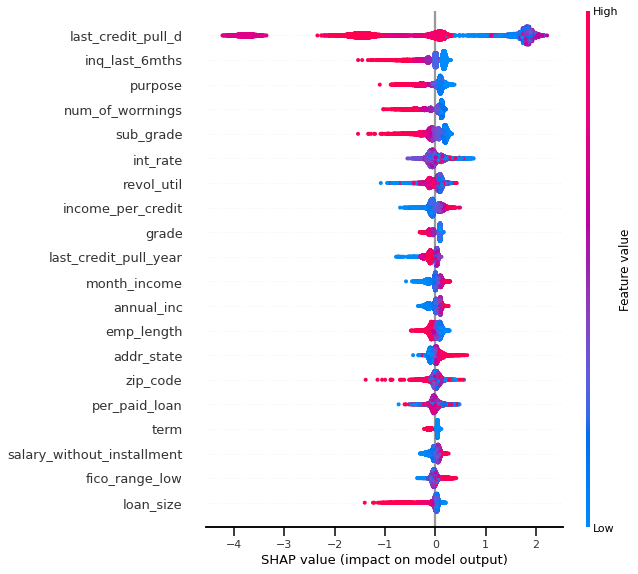

In [105]:
shap.summary_plot(shap_values, X_train)

Text(0.5, 0, 'Importance')

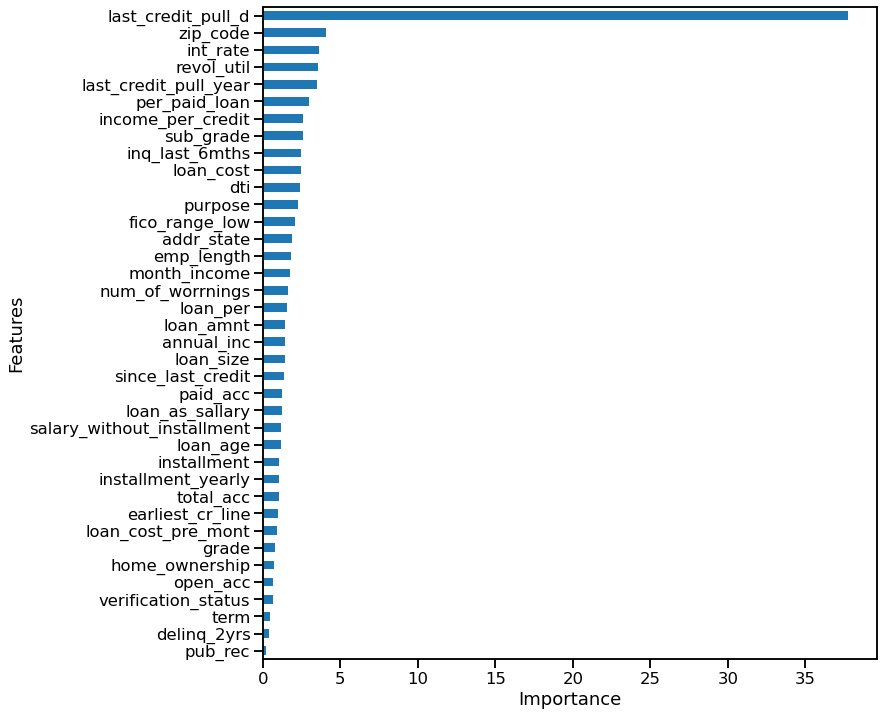

In [106]:
coeff = model.feature_importances_
labels = list(X_train.columns)
features = pd.DataFrame()
features['Features'] = labels
features['importance'] = coeff
features.sort_values(by=['importance'], ascending=True, inplace=True)
features['positive'] = features['importance'] > 0
features.set_index('Features', inplace=True)
features.importance.plot(kind='barh', figsize=(11, 12))
plt.xlabel('Importance')